# Universidad de Buenos Aires
# Aprendizaje Profundo - TP3
# Cohorte 25 - 3er bimestre 2026


## **Alumno 1:** Rubiolo Pedro Ignacio

## **Alumno 2:** Tolotto Lourdes Sofia

Este tercer y último TP se debe entregar hasta las **23:59hs del martes 25 de agosto (hora de Argentina)**.

La resolución del TP se puede hacer en **parejas** o de forma **individual**.

Pueden utilizar los contenidos vistos en clase y otra bibliografía que consideren que les haga falta. Si se toman ideas de fuentes externas deben ser correctamente citadas incluyendo el correspondiente link o página de libro.

ESTE TP3 EQUIVALE A UN TERCIO DE SU NOTA FINAL.

El formato de entrega debe ser un link a un notebook de google colab. Permitir acceso a gvilcamiza.ext@fi.uba.ar y **habilitar los comentarios, para poder darles el feedback**. Si no lo hacen así no se podrá dar el feedback respectivo por cada pregunta.

El envío **se realizará en el siguiente link de google forms: [link](https://forms.gle/4gQ7iQQyJd2tn4Mb9)**. Tanto los resultados, gráficas, como el código y las explicaciones deben quedar guardados y visualizables en el colab.

**NO SE VALIDARÁN ENVÍOS POR CORREO, EL MÉTODO DE ENTREGA ES SOLO POR EL FORMS.**

**Consideraciones a tener en cuenta:**
- Se entregará 1 solo colab para este TP3.
- Renombrar el archivo de la siguiente manera: **PRIMERAPELLIDOALUMNO1-PRIMERNOMBREALUMNO1-PRIMERAPELLIDOALUMNO2-PRIMERNOMBREALUMNO2-TP3-Co25.ipynb**
O en caso hacerlo individual usar: **PRIMERAPELLIDO-PRIMERNOMBRE-TP3-Co25.ipynb**
- Los códigos deben poder ejecutarse.
- **IMPORTANTE:** Los resultados, cómo el código, los gráficos, los prints y las explicaciones deben quedar guardados y visualizables en el mismo notebook.
- No ocultar celdas, todas se deben poder ver desde el inicio.
- **Prestar mucha atención a cada consigna, responder las preguntas justo debajo del enunciado que corresponda.**
- Solo se revisarán los trabajos que hayan sido enviados por el forms.

# **CLASIFICADOR DE EMOCIONES**

El objetivo de este trabajo es construir una red neuronal convolucional (CNN) utilizando Pytorch, capaz de clasificar emociones humanas a partir de imágenes faciales. El clasificador deberá identificar una de las 7 emociones básicas: alegría, tristeza, enojo, miedo, sorpresa, disgusto y seriedad. El dataset se encuentra en este link: https://drive.google.com/file/d/1aPHE00zkDhEV1waJKhaOJMdN6-lUc0iT/view?usp=sharing

Les recomiendo usar el siguiente código para poder obtener las imágenes fácilmente desde ese link. Pero son libres de descargar las imágenes como mejor les parezca.

In [2]:
import gdown
import zipfile
import os

url = "https://drive.google.com/uc?id=1aPHE00zkDhEV1waJKhaOJMdN6-lUc0iT"
output = "archivo.zip"

gdown.download(url, output, quiet=False)

destino = "datos_zip"
os.makedirs(destino, exist_ok=True)

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(destino)

DATASET_ROOT_TRAIN = '/content/datos_zip/dataset_emociones/train'
DATASET_ROOT_VAL   = '/content/datos_zip/dataset_emociones/validation'


Downloading...
From (original): https://drive.google.com/uc?id=1aPHE00zkDhEV1waJKhaOJMdN6-lUc0iT
From (redirected): https://drive.google.com/uc?id=1aPHE00zkDhEV1waJKhaOJMdN6-lUc0iT&confirm=t&uuid=24dc2907-1e77-4365-9403-b051a0bdf92b
To: /home/nacho/Documents/CEIA/aprendizaje_profundo/TPs/TP3/archivo.zip
100%|██████████| 40.0M/40.0M [00:11<00:00, 3.45MB/s]


## 1. Preprocesamiento de Datos (2 puntos)

Antes de entrenar el modelo, se debe analizar qué tipo de preprocesamiento se debe aplicar a las imágenes. Para esto, se puede considerar uno o más aspectos como:

- Tamaño
- Relación de aspecto
- Color o escala de grises
- Cambio de dimensionalidad
- Normalización
- Balanceo de datos
- Data augmentation
- etc.

Sean criteriosos y elijan solo las técnicas que consideren pertinentes para este caso de uso en específico.

Recomendación: usar `torchvision.transforms` para facilitar el preprocesamiento. Lean su documentación si tienen dudas: https://docs.pytorch.org/vision/0.14/transforms.html



### Resolución
Para el preprocesamiento, se consideró:
- Mantener el tamaño original de las imágenes (100x100).
- Se utilizará escala de grises, ya que consideramos que el color en este problema no aporta información significativa.
- Se normalizará utilizando estandarización, ya que suele ser provechoso para redes convolucionales.
- Se hará augmentation con TrivialAugmentWide.
- Debido al desbalanceo existente, se ajustara la función de perdida para castigar mas el error sobre las clases minoritarias en vez de descartar observaciones o crear nuevas.

In [23]:
import torch
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.transforms import v2

# Transformaciones
train_transform = v2.Compose([
    v2.Resize((100, 100)),
    v2.Grayscale(num_output_channels=1),
    v2.TrivialAugmentWide(),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.5], std=[0.5])
])

val_transform = v2.Compose([
    v2.Resize((100, 100)),
    v2.Grayscale(num_output_channels=1),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.5], std=[0.5])
])

# Datasets
train_dataset = datasets.ImageFolder(
    root='datos_zip/dataset_emociones/train',
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root='datos_zip/dataset_emociones/validation',
    transform=val_transform
)

# Ver labels
print(train_dataset.class_to_idx)

{'alegria': 0, 'disgusto': 1, 'enojo': 2, 'miedo': 3, 'seriedad': 4, 'sorpresa': 5, 'tristeza': 6}


## 2. Construcción y entrenamiento del Modelo CNN (3.5 puntos)

- Construir una red neuronal convolucional con PyTorch, **sin usar modelos pre-entrenados**.
- Analizar correctamente qué funciones de activación se deben usar en cada etapa de la red, el learning rate a utilizar, la función de costo y el optimizador.
- Cosas como el número de capas, neuronas, número y tamaño de los kernels, entre otros, queda a criterio de ustedes, pero deben estar justificadas.

### Resolución
Se propone utilizar una red neuronal convolucional, con la siguiente forma:
- 4 bloques de convolución (convolución + activación + pooling) todas con stride de 1.
    - El primer bloque con input de 1x100x100 de las imágenes del dataset, 32 canales de salida, kernel de 5x5 y pooling de 2, devolviendo una salida de 32x50x50.
    - El segundo bloque con input de 32x50x50, 64 canales de salida, kernel de 3x3 y pooling de 2, devolviendo una salida de 64x25x25.
    - El tercer bloque con input de 64x25x25, 128 canales de salida, kernel de 3x3 y pooling de 2, devolviendo una salida de 128x12x12.
    - El cuarto bloque con input de 128x12x12, 248 canales de salida, kernel de 3x3 y pooling de 2, devolviendo una salida de 248x6x6.
- Dropout con probabilidad 0.2 después de los bloques de convolución 3 y 4.
- 1 capa de Global average pooling devolviendo una salida de 248x1x1
- 1 capa fully connected, con una capa de entrada de dimension 248 y salida de dimension 128, con función de activación GeLu.
- 1 capa de dropout con probabilidad de 0.2.
- 1 capa fully connected, con una dimension de entrada 128 y salida 7.

Esta red se entrenara usando Adam MiniBatch con batch size de 64 y learning rate de 1e-3 y como función de perdida a CrossEntropyLoss, con pesos por clase.

Para definir la arquitectura se usaron los siguientes criterios:
- Aumentar la cantidad de canales de los bloques de convolución a medida que se avanza en profundidad para detectar features más primitivas en los primeros niveles y features más avanzadas en los más profundos.
- Kernel size de 5x5 en el primer bloque y kernel size de 3x3 en los siguientes, debido a que la dimension de los features map disminuye y mantener un kernel fijo podría hacer que se pierda granularidad.
- Mantener stride de 1 y padding same con el fin de solo reducir la dimension en la capa de maxpool.
- Usar GeLu como función de activación ya que previene neuronas muertas.
- Utilizar global average pooling antes de ingresar a la Fully Connected para enviarle a esta directamente la "señal sináptica" asociada a cada Kernel de la red.
- Definir la dimension de salida de la fully connected layer en función de la cantidad de clases a clasificar
- No incluir dentro del modelo la función softmax ya que se aconseja usar `nn.CrossEntropyLoss` con la salida de los logits directamente. Cuando se use el modelo se deberá pasar la salida por la funcián softmax para obtener probabilidades.
- Utilizar CrossEntropyLoss por ser un problema de clasificación multiclase y usar pesos por clase para lidiar con el desbalance del dataset.
- Adam Minibatch como optimizador por ser aquel que en general da mejores resultados.
- Learning rate de 1e-3 ya que valores mayores empíricamente no lograron converger.
- Entrenar el modelo sin un numero fijo de épocas sino utilizar un mecanismo de early stopping para cortar el mismo al converger.

In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def conv_block(ch_in, ch_out, k_size=3, pad='same', stride=1, pool=2):        
    return nn.Sequential(                              
        nn.Conv2d(ch_in, ch_out, k_size, padding=pad, stride=stride),
        nn.GELU(),                                     
        nn.MaxPool2d(pool)                               
    )

class CNN(nn.Module):
    def __init__(
        self,
        n_channels=1,
        n_outputs=7,
        channels=(32, 64, 128, 248),
        kernel_sizes=(5, 3, 3, 3),
        dropout=0.2,
        padding='same',
        stride=1,
        pool_kernel=2
    ):
        super().__init__()

        # Conv Blocks
        self.conv1 = conv_block(n_channels, channels[0], kernel_sizes[0], pad=padding, stride=stride, pool=pool_kernel)
        self.conv2 = conv_block(channels[0], channels[1], kernel_sizes[1], pad=padding, stride=stride, pool=pool_kernel)
        self.conv3 = conv_block(channels[1], channels[2], kernel_sizes[2], pad=padding, stride=stride, pool=pool_kernel)
        self.conv4 = conv_block(channels[2], channels[3], kernel_sizes[3], pad=padding, stride=stride, pool=pool_kernel)

        # Dropouts
        self.drop_conv = nn.Dropout2d(p=dropout) # Para convolucion

        # Global Average Pooling, queda de dimension igual a la cantidad de
        # canales de la ultima convolucion
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))

        # Fully Connected
        self.fc1 = nn.Linear(channels[3], 128)
        self.drop_fc = nn.Dropout(p=dropout)
        self.fc2 = nn.Linear(128, n_outputs)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.drop_conv(x)
        x = self.conv4(x)
        x = self.drop_conv(x)
        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        x = F.gelu(self.fc1(x))
        x = self.drop_fc(x)
        x = self.fc2(x)
        
        return x


In [25]:
# Grafico para ver mientras se entrena
from IPython.display import clear_output
import matplotlib.pyplot as plt
def plot_live_history(history):
    df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))
    # Loss
    axes[0].plot(df['epoch'], df['train_loss'], label='Train Loss')
    axes[0].plot(df['epoch'], df['val_loss'], label='Val Loss')
    axes[0].set_title('Loss per Epoch')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid(True)
    # Accuracy
    axes[1].plot(df['epoch'], df['train_acc'], label='Train Acc')
    axes[1].plot(df['epoch'], df['val_acc'], label='Val Acc')
    axes[1].set_title('Accuracy per Epoch')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    axes[1].grid(True)
    # F1 Macro
    axes[2].plot(df['epoch'], df['train_f1_macro'], label='Train F1')
    axes[2].plot(df['epoch'], df['val_f1_macro'], label='Val F1')
    axes[2].set_title('Macro F1 per Epoch')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('F1 Score')
    axes[2].legend()
    axes[2].grid(True)
    plt.tight_layout()
    plt.show()


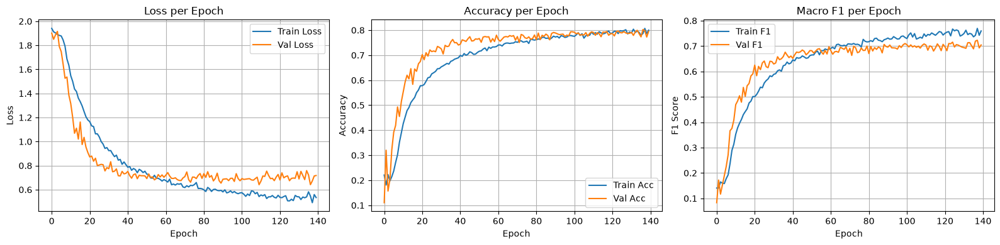


Best Loss: 0.6412


In [27]:
from importlib.abc import PathEntryFinder
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score
from tqdm import tqdm
from torch.utils.data import WeightedRandomSampler

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Training on device: {device}")

# Parametros de entreanmiento
LEARNING_RATE = 1e-3
BATCH_SIZE = 64
# Early stopping
PATIENCE = 30    # Limite de epocas sin mejorar
MIN_DELTA = 1e-4        # Delta para considerar como mejora
patience_counter = 0

# Class weights
targets = np.array(train_dataset.targets)
class_counts = np.bincount(targets)
total_samples = len(targets)
num_classes = len(class_counts)
class_weights = total_samples / (num_classes * class_counts)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

print("Class counts:", class_counts)
print("Class weights:", class_weights_tensor)

# Modelo, Loss, Optim
model = CNN().to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
# criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# Dict para graficar
history = {
    'epoch': [],
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': [],
    'train_f1_macro': [],
    'val_f1_macro': []
}

best_val_loss = float('inf')
best_model_weights = None

# --Entrenamiento--
epoch = 0
while True:
    # train
    model.train()
    running_train_loss = 0.0
    train_preds, train_targets = [], []

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * images.size(0)
        
        preds = torch.argmax(outputs, dim=1)
        train_preds.extend(preds.cpu().numpy())
        train_targets.extend(labels.cpu().numpy())

    epoch_train_loss = running_train_loss / len(train_dataset)
    epoch_train_acc = accuracy_score(train_targets, train_preds)
    epoch_train_f1 = f1_score(train_targets, train_preds, average='macro')

    # validate
    model.eval()
    running_val_loss = 0.0
    val_preds, val_targets = [], []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_val_loss += loss.item() * images.size(0)
            
            preds = torch.argmax(outputs, dim=1)
            val_preds.extend(preds.cpu().numpy())
            val_targets.extend(labels.cpu().numpy())

    epoch_val_loss = running_val_loss / len(val_dataset)
    epoch_val_acc = accuracy_score(val_targets, val_preds)
    epoch_val_f1 = f1_score(val_targets, val_preds, average='macro')

    # Guardar resultados de epoca
    history['epoch'].append(epoch)
    history['train_loss'].append(epoch_train_loss)
    history['val_loss'].append(epoch_val_loss)
    history['train_acc'].append(epoch_train_acc)
    history['val_acc'].append(epoch_val_acc)
    history['train_f1_macro'].append(epoch_train_f1)
    history['val_f1_macro'].append(epoch_val_f1)
    
    # Resultado de epoca
    print(f"Epoch {epoch:02d} | "
          f"Train Loss: {epoch_train_loss:.4f} | Val Loss: {epoch_val_loss:.4f} | "
          f"Train Acc: {epoch_train_acc:.4f} | Val Acc: {epoch_val_acc:.4f} | "
          f"Train F1: {epoch_train_f1:.4f} | Val F1: {epoch_val_f1:.4f}")

    # Mostrar grafico cada 10 epocas
    if (epoch) % 10 == 0:
        clear_output(wait=True)
        plot_live_history(history)

    # Guardar modelo y ealry stopping
    if epoch_val_loss < (best_val_loss - MIN_DELTA):
        best_val_loss = epoch_val_loss
        best_model_weights = copy.deepcopy(model.state_dict())
        torch.save(model.state_dict(), 'best_model.pt')
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= PATIENCE:
            print('\n Cortando entrenamiento por Early Stopping')
            clear_output(wait=True)
            plot_live_history(history)
            break

    epoch += 1
# Cargamos el de mejor loss en val
model.load_state_dict(best_model_weights)
print(f"\nBest Loss: {best_val_loss:.4f}")


## 3. Evaluación del Modelo (2.5 puntos)

El modelo entrenado debe ser evaluado utilizando las siguientes métricas:

- **Accuracy**:
  - Reportar el valor final en el conjunto de validación.
  - Incluir una gráfica de evolución por época para entrenamiento y validación.

- **F1 Score Macro**:
  - Reportar el valor final en el conjunto de validación.
  - Incluir una gráfica de evolución por época para entrenamiento y validación.

- **Costo (Loss)**:
  - Mostrar una gráfica de evolución del costo por época para entrenamiento y validación.

- **Classification report**
  - Mostrar la precisión, recall y F1 score por cada clase usando `classification_report`

- **Matriz de confusión**:
  - Mostrar la matriz de confusión absoluta (valores enteros).
  - Mostrar la matriz de confusión normalizada (valores entre 0 y 1 por fila).

Se recomienda utilizar `scikit-learn` para calcular métricas como accuracy, F1 score, el Classification report y las matrices de confusión. Las visualizaciones pueden realizarse con `matplotlib` o `seaborn`.


### Resolución


CLASSIFICATION REPORT
              precision    recall  f1-score   support

     alegria     0.9026    0.8920    0.8973      1185
    disgusto     0.4943    0.5375    0.5150       160
       enojo     0.7012    0.7099    0.7055       162
       miedo     0.5467    0.5541    0.5503        74
    seriedad     0.7788    0.7765    0.7776       680
    sorpresa     0.7818    0.7842    0.7830       329
    tristeza     0.7311    0.7280    0.7296       478

    accuracy                         0.7930      3068
   macro avg     0.7052    0.7117    0.7083      3068
weighted avg     0.7950    0.7930    0.7939      3068



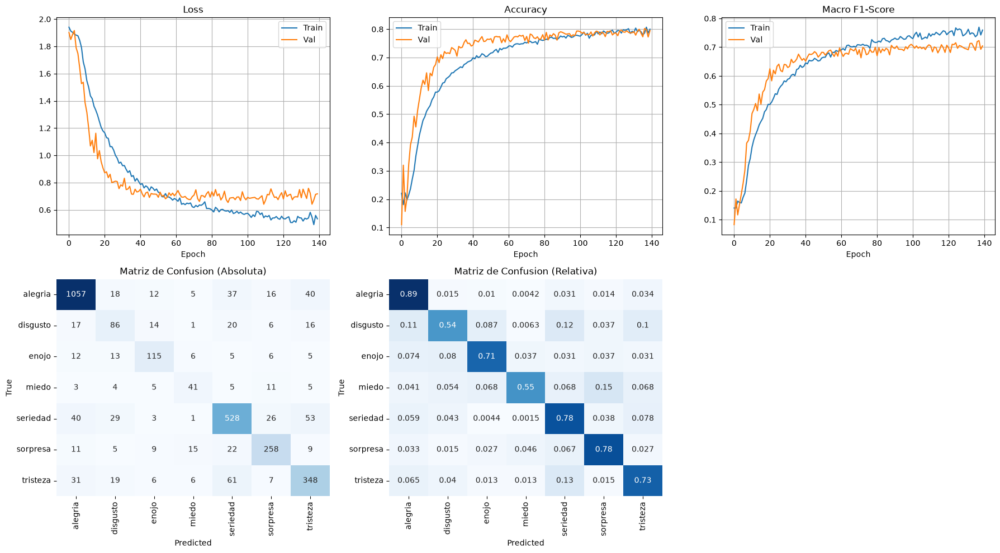

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import torch
from sklearn.metrics import classification_report, confusion_matrix

# Cargamos el modelo
model.load_state_dict(best_model_weights)
model.eval()

# Predecimos sobre val
val_preds, val_targets = [], []
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
        
        val_preds.extend(preds.cpu().numpy())
        val_targets.extend(labels.cpu().numpy())

# Labels
class_names = getattr(train_dataset, 'classes', [str(i) for i in range(num_classes)])

# Classification Report
print("\n" + "=" * 60)
print("CLASSIFICATION REPORT")
print("=" * 60)
print(classification_report(val_targets, val_preds, target_names=class_names, digits=4))

# Matrices de Confusion
cm_abs = confusion_matrix(val_targets, val_preds)
cm_rel = confusion_matrix(val_targets, val_preds, normalize='true')

# Graficas F1, Loss, Accuracy
df_history = pd.DataFrame(history)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Loss
axes[0, 0].plot(df_history['epoch'], df_history['train_loss'], label='Train')
axes[0, 0].plot(df_history['epoch'], df_history['val_loss'], label='Val')
axes[0, 0].set_title('Loss')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Accuracy
axes[0, 1].plot(df_history['epoch'], df_history['train_acc'], label='Train')
axes[0, 1].plot(df_history['epoch'], df_history['val_acc'], label='Val')
axes[0, 1].set_title('Accuracy')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].legend()
axes[0, 1].grid(True)

# F1 Macro
axes[0, 2].plot(df_history['epoch'], df_history['train_f1_macro'], label='Train')
axes[0, 2].plot(df_history['epoch'], df_history['val_f1_macro'], label='Val')
axes[0, 2].set_title('Macro F1-Score')
axes[0, 2].set_xlabel('Epoch')
axes[0, 2].legend()
axes[0, 2].grid(True)

# CM Absoluta
sns.heatmap(
    cm_abs, 
    annot=True, 
    fmt='d', 
    cmap='Blues', 
    xticklabels=class_names, 
    yticklabels=class_names, 
    ax=axes[1, 0], 
    cbar=False
)
axes[1, 0].set_title('Matriz de Confusion (Absoluta)')
axes[1, 0].set_xlabel('Predicted')
axes[1, 0].set_ylabel('True')

# CM Relativa
sns.heatmap(
    cm_rel, 
    annot=True, 
    fmt='.2', 
    cmap='Blues', 
    xticklabels=class_names, 
    yticklabels=class_names, 
    ax=axes[1, 1], 
    cbar=False
)
axes[1, 1].set_title('Matriz de Confusion (Relativa)')
axes[1, 1].set_xlabel('Predicted')
axes[1, 1].set_ylabel('True')

# Ocultar celda 6
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


 ## 4. Prueba de Imágenes Nuevas (1 punto)
Subir al menos 12 imágenes personales de cualquier ratio o relación de aspecto (pueden usar fotos del rostro de ustedes, rostros de personas generadas por IA o imágenes stock de internet), que no formen parte del dataset de entrenamiento ni de validación. Tampoco vale usar imágenes de otro dataset, deben ser imágenes sueltas.

- Debe haber al menos una imagen para cada emoción.

- Aplicar el mismo pre-procesamiento que se usó para el dataset de validation durante el entrenamiento del modelo.

- Pasar las imágenes por el modelo entrenado y mostrar:

  - La imagen original
  - La imagen pre-procesada (mismas transformaciones que durante el entrenamiento)
  - El score asignado a cada clase (normalizado de 0 a 1 o de 0% a 100%)
  - La clase ganadora inferida por el modelo

- Redactar conclusiones preliminares

### Resolución

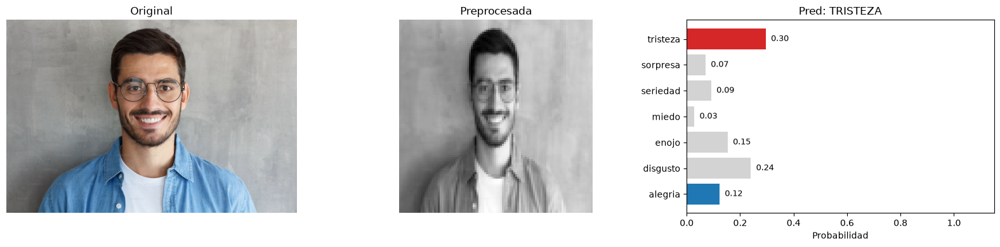

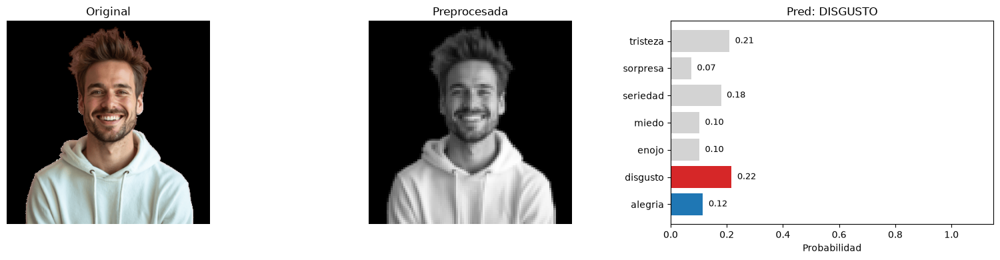

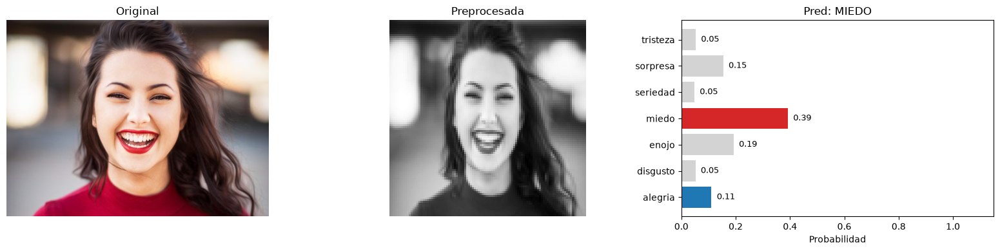

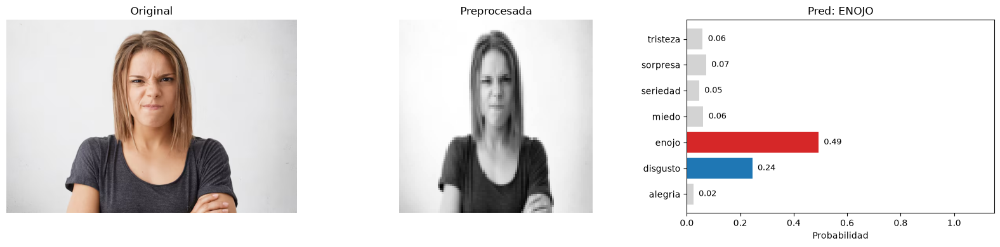

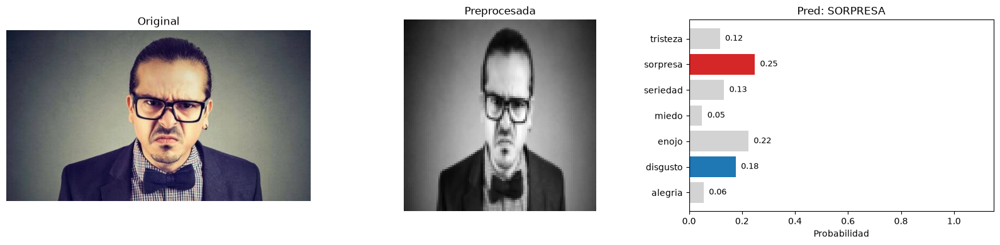

...

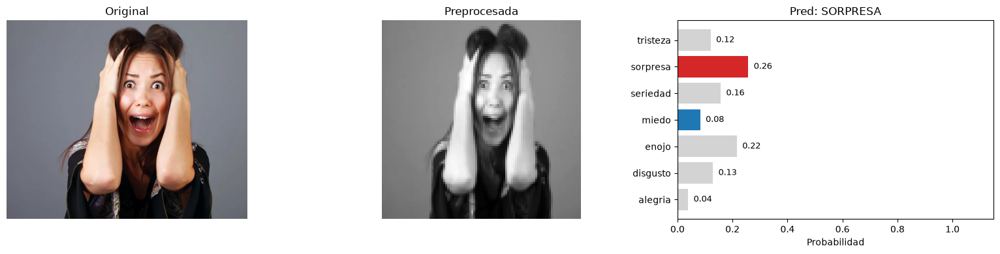

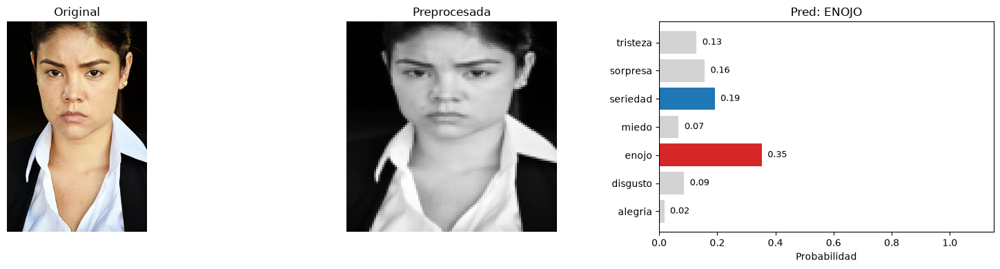

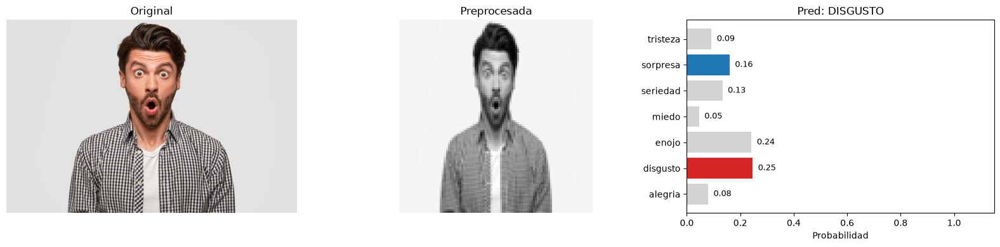

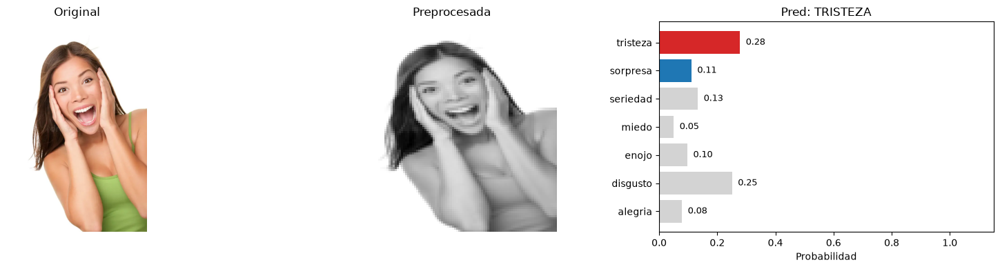

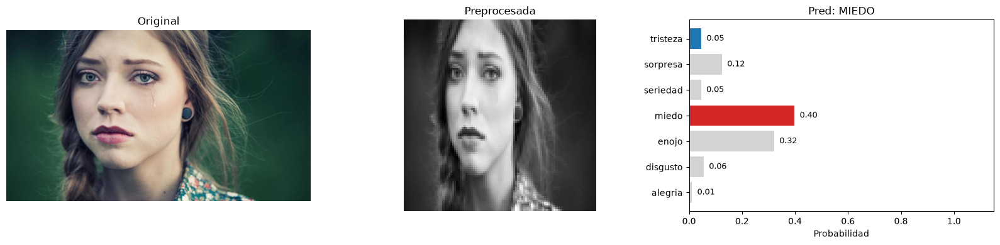

In [34]:
import os
import glob
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import v2

# Path
test_data_dir = 'test_data'

# Cargamos el modelo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
state_dict = torch.load('best_model.pt', map_location=device, weights_only=True)
model.load_state_dict(state_dict)
model.eval()

# Labels
class_names = getattr(train_dataset, 'classes', ['alegria', 'disgusto', 'enojo', 'miedo', 'seriedad', 'sorpresa', 'tristeza'])

# Listamos las imagenes
image_extensions = ('*.jpg', '*.jpeg', '*.png', '*.webp', '*.avif')
image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(test_data_dir, ext)))
image_paths = sorted(image_paths)

# Predecimos
for idx, img_path in enumerate(image_paths, 1):
    filename = os.path.basename(img_path)
    
    # Extraemos el label por nombre del archivo
    file_stem = os.path.splitext(filename)[0]
    expected_label = file_stem.split('_')[0].strip().lower()
    expected_idx = class_names.index(expected_label) if expected_label in class_names else None

    # Cargamos 
    orig_img = Image.open(img_path).convert('RGB')
    tensor_img = val_transform(orig_img)                  
    input_tensor = tensor_img.unsqueeze(0).to(device)

    # Corremos el modelo
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)[0].cpu().numpy()

    winning_idx = np.argmax(probabilities)
    winning_class = class_names[winning_idx]
    winning_score = probabilities[winning_idx]

    is_correct = (winning_idx == expected_idx)

    # Desnormalizamos para visualizar
    prep_img_np = tensor_img[0].cpu().numpy() * 0.5 + 0.5

    # Color de barra segun resultado obtenido
    colors = []
    for i in range(len(class_names)):
        if is_correct and i == winning_idx:
            colors.append('#2ca02c')  # Correcto
        elif i == expected_idx:
            colors.append('#1f77b4')  # Esperada
        elif i == winning_idx:
            colors.append('#d62728')  # Predicha erronea
        else:
            colors.append('#d3d3d3')  # Otras

    # Graficamos
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # Imagen Original
    axes[0].imshow(orig_img)
    axes[0].axis('off')
    axes[0].set_title("Original")

    # Preprocesada
    axes[1].imshow(prep_img_np, cmap='gray')
    axes[1].axis('off')
    axes[1].set_title("Preprocesada")

    # Barras
    bars = axes[2].barh(class_names, probabilities, color=colors)
    axes[2].set_xlim(0, 1.15)
    axes[2].set_xlabel("Probabilidad")
    
    if expected_label in class_names:
        axes[2].set_title(f"Pred: {winning_class.upper()}")
    else:
        raise ValueError("Error de tipeo en la imagen")

    for bar in bars:
        width = bar.get_width()
        axes[2].text(width + 0.02, bar.get_y() + bar.get_height() / 2, 
                     f'{width:.2f}', va='center', ha='left', fontsize=9)

    plt.tight_layout()
    plt.show()

#### Conclusiones preliminares

Tras correr este experimento se observa como correctamente se cargan las imágenes utilizando el procesamiento de la red, pero este presenta un mal desempeño al hacer la clasificación, ya que solo acierta 2 veces de 13.

No solo el resultado de la clasificación es malo, sino que también el modelo no suele tener certeza de la clase a asignar ya que en la mayoría de los casos no hay una salida considerablemente mayor a las demás.

Como si fuera poco, el modelo ademas tiende a confundir clases que son bastante opuestas, como por ejemplo tristeza y alegría, alegría y disgusto o tristeza y sorpresa. Quizá se podría esperar confusion en emociones más similares como la de alegría y sorpresa, o sorpresa y susto.

Estos resultados pueden adjudicarse a la disparidad entre la forma de las imágenes que se utilizaron para entrenar y las que se usaron para inferencia. En el dataset de entrenamiento, todas las imágenes contienen unicamente rostros, mientras que aca se tienen imágenes a medio cuerpo. Es por ello que se debe hacer una prueba más justa, como la que se plantea en el siguiente ejercicio.

 ## 5. Prueba de Imágenes Nuevas con Pre-procesamiento Adicional (1 punto)
Las 12 imágenes del punto 4, ahora serán pasadas y recortadas por un algoritmo de detección de rostros. Usen el siguiente código para realizar un pre-procesamiento inicial de la imagen y ya luego aplican el pre-procesamiento que usaron al momento de entrenar el modelo.

- Pasar las imágenes por el modelo entrenado y mostrar:
  - La imagen original
  - La imagen recortada por el algoritmo
  - La imagen pre-procesada (mismas transformaciones del entrenamiento)
  - El score asignado a cada clase (normalizado de 0 a 1 o de 0% a 100%)
  - La clase esperada
  - La clase ganadora inferida por el modelo

- Analizar los casos en los que el modelo se equivoca e intentar identificar posibles causas, tales como:

  - Similitudes entre emociones.
  - Mezcla de 2 o más emociones en una misma expresión.

- Comparar los resultados con el punto 4 y redactar conclusiones finales.

**IMPORTANTE:** Ajusten los parámetros `scaleFactor`, `minNeighbors` y `minSize` según convenga para que la detección de rostros sea más efectiva y logre detectar rostros en sus 12 imágenes. No se queden necesariamente con los valores por defecto.

### Resolución

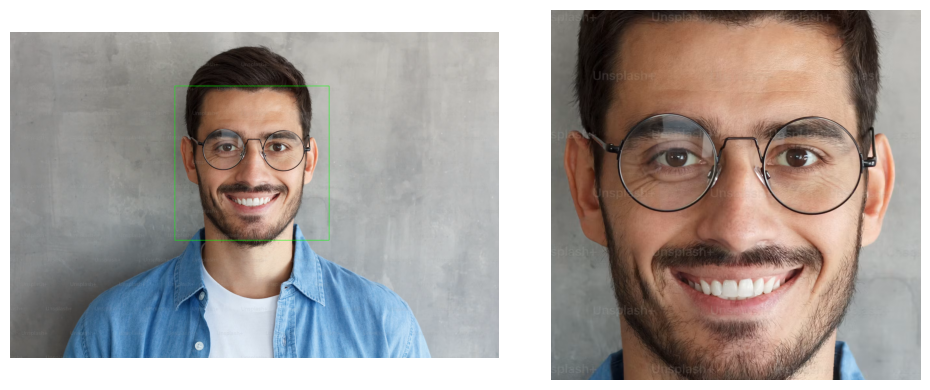

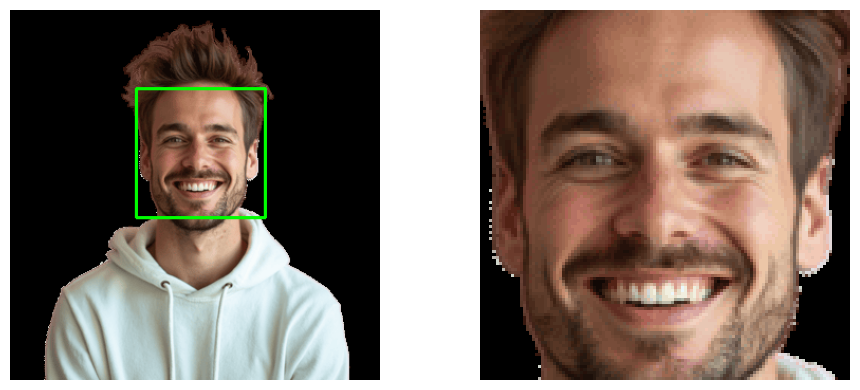

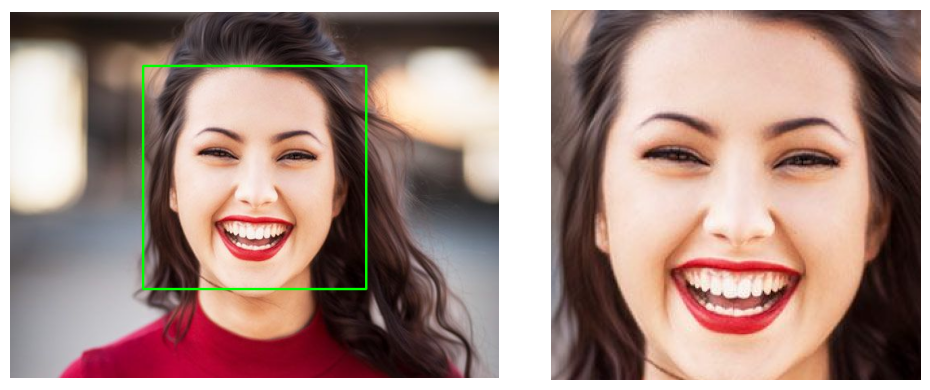

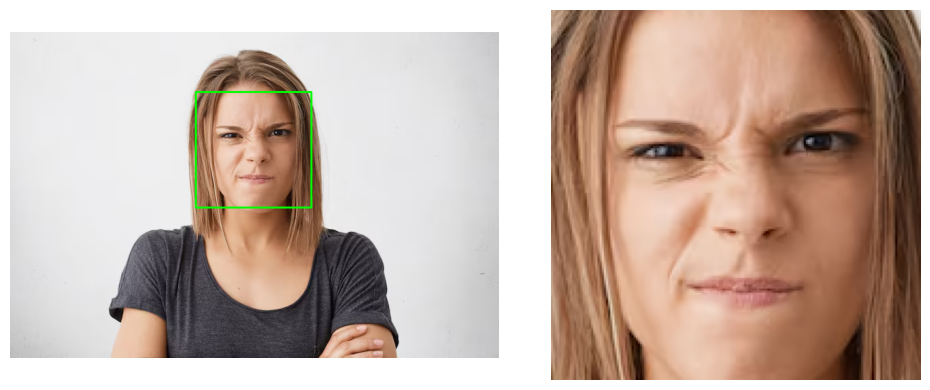

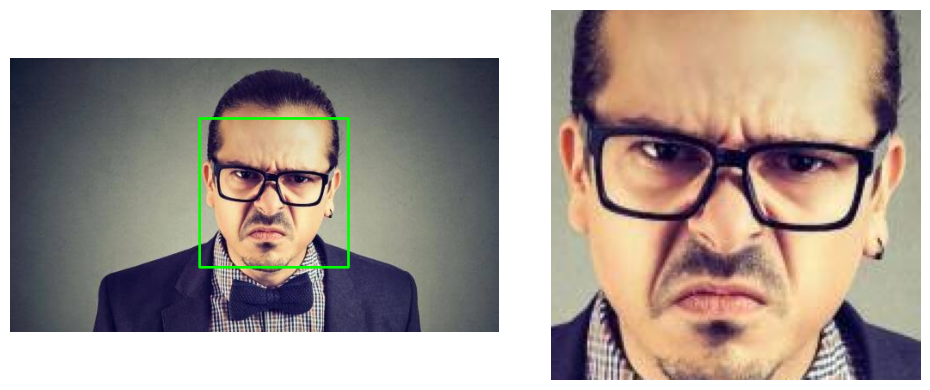

...

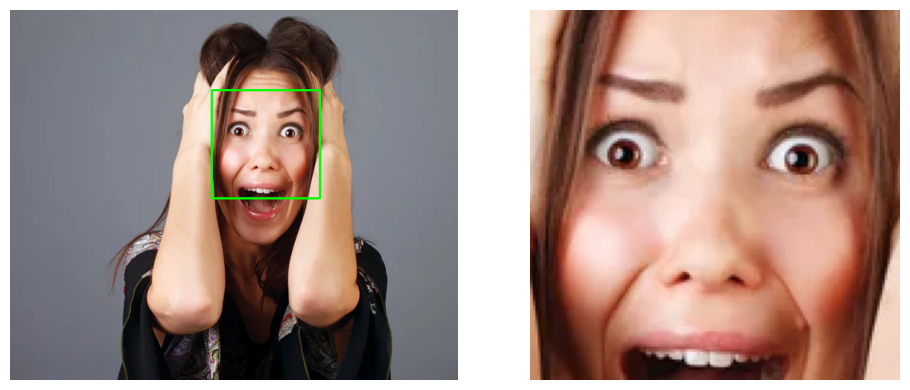

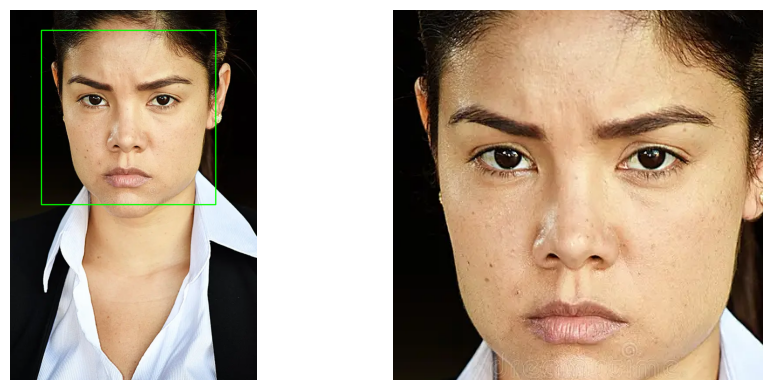

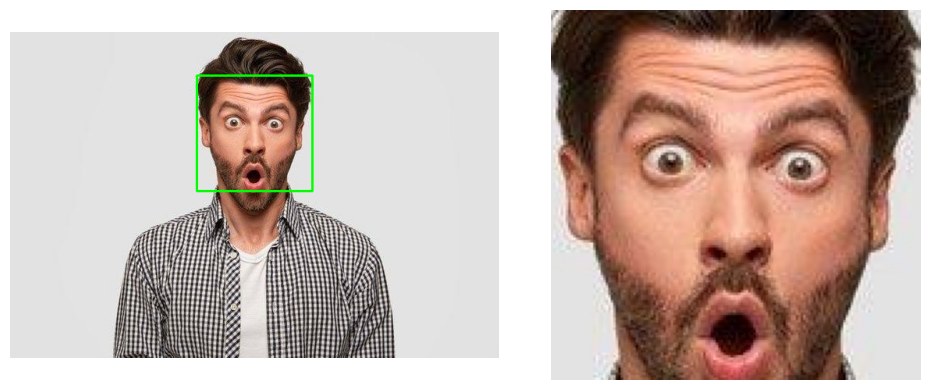

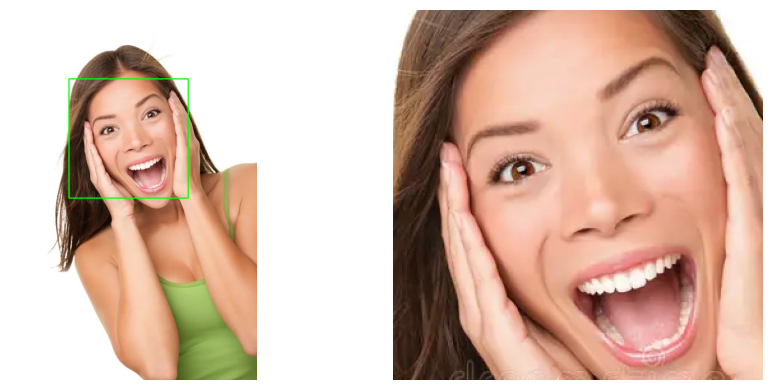

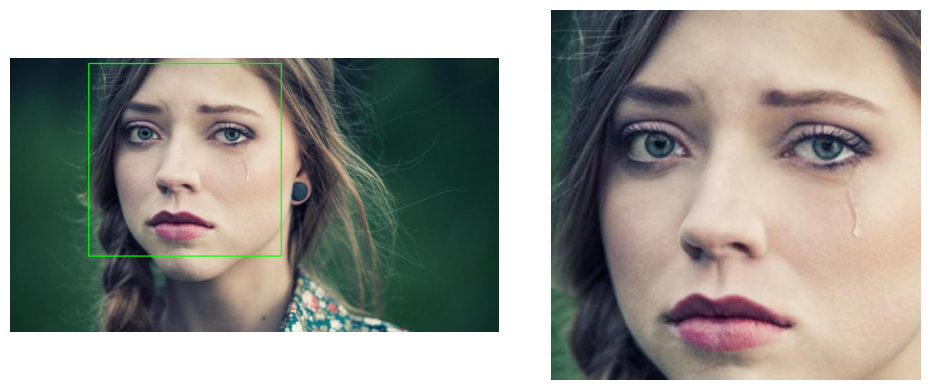

In [35]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Paths
input_dir = "test_data"
output_dir = "./test_data_cropped"
os.makedirs(output_dir, exist_ok=True)

# Listamos imagenes
valid_exts = ('.jpg', '.jpeg', '.png', '.webp', '.avif', '.bmp')
image_files = [f for f in sorted(os.listdir(input_dir)) if f.lower().endswith(valid_exts)]

# Detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Iteramos por imagen
for filename in image_files:
    image_path = os.path.join(input_dir, filename)
    image = cv2.imread(image_path)
    
    if image is None:
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=3, minSize=(30, 30))

    image_with_box = image.copy()
    cropped_face_rgb = None

    if len(faces) > 0:
        (x, y, w, h) = max(faces, key=lambda b: b[2] * b[3])
        cv2.rectangle(image_with_box, (x, y), (x + w, y + h), (0, 255, 0), 2)
        center_x, center_y = x + w // 2, y + h // 2
        side = max(w, h)
        half_side = side // 2
        x1 = max(center_x - half_side, 0)
        y1 = max(center_y - half_side, 0)
        x2 = min(center_x + half_side, image.shape[1])
        y2 = min(center_y + half_side, image.shape[0])

        cropped_face = image[y1:y2, x1:x2]
        cropped_face_rgb = cv2.cvtColor(cropped_face, cv2.COLOR_BGR2RGB)

        # Guardmamos
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, cropped_face)

    image_with_box_rgb = cv2.cvtColor(image_with_box, cv2.COLOR_BGR2RGB)

    # Mostramos resultados
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].imshow(image_with_box_rgb)
    ax[0].axis('off')

    if cropped_face_rgb is not None:
        ax[1].imshow(cropped_face_rgb)
        ax[1].axis('off')
    else:
        ax[1].text(0.5, 0.5, 'Sin deteccion', horizontalalignment='center', verticalalignment='center')
        ax[1].axis('off')

    plt.tight_layout()
    plt.show()



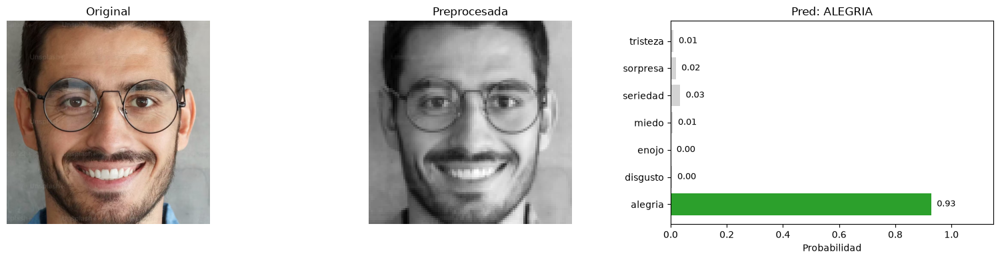

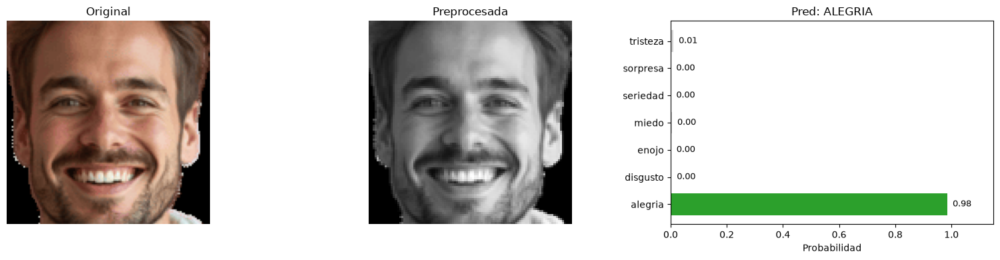

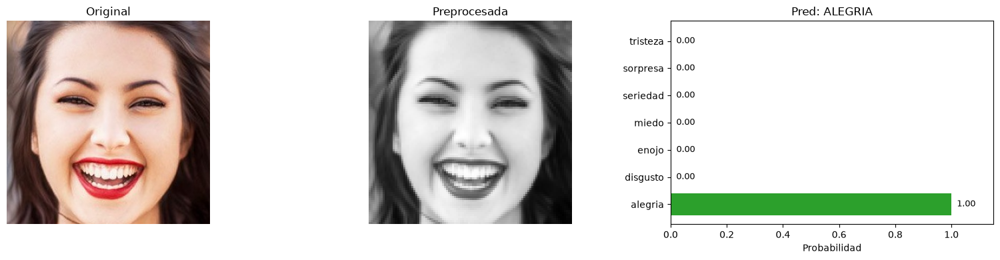

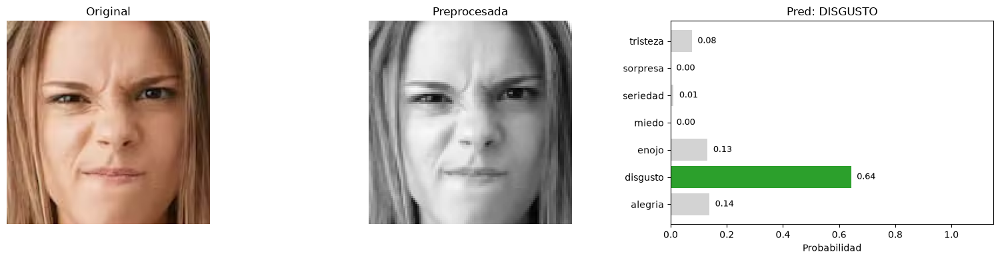

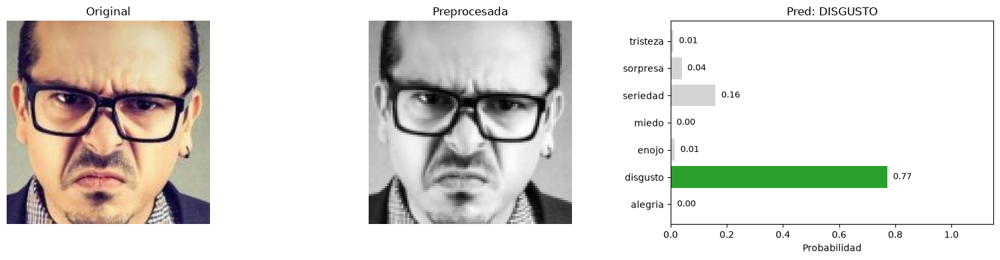

...

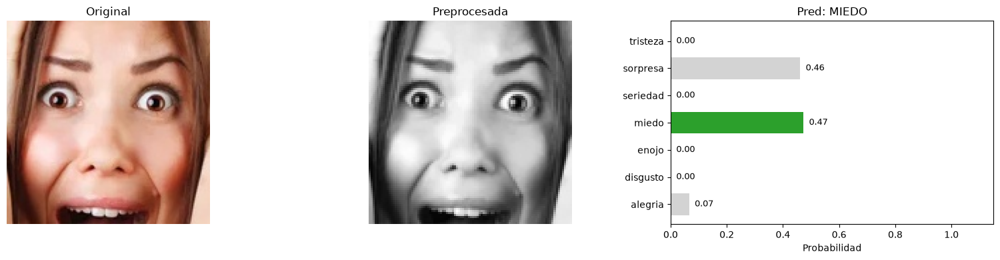

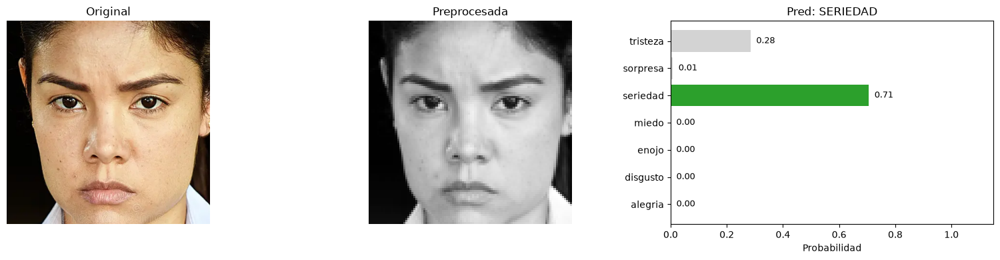

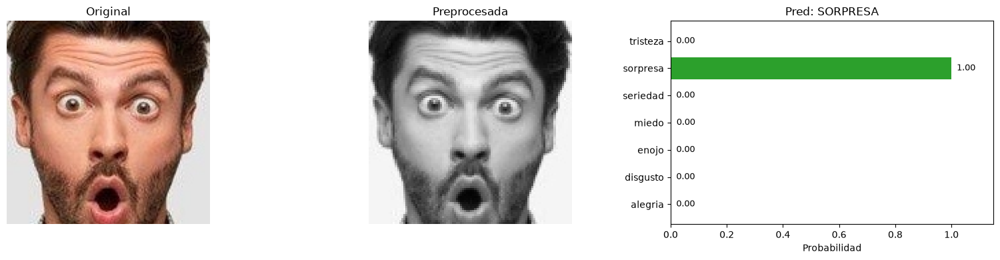

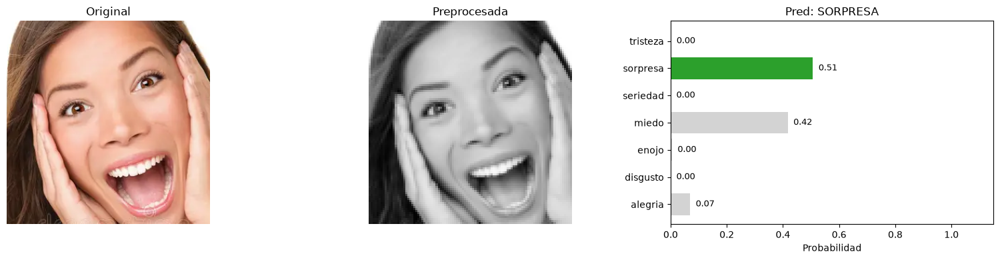

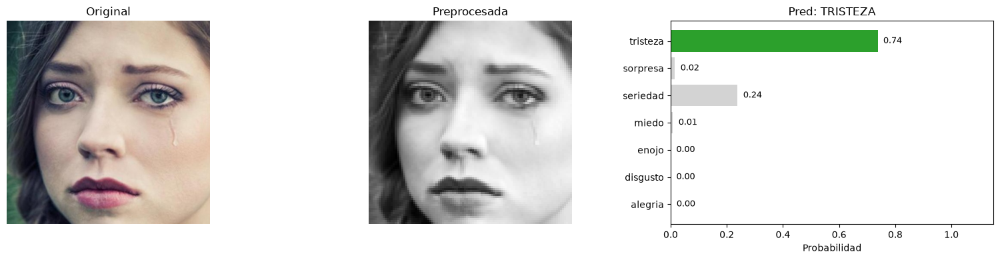

In [36]:
import os
import glob
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import v2

# Path
test_data_dir = 'test_data_cropped'

# Cargamos el modelo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
state_dict = torch.load('best_model.pt', map_location=device, weights_only=True)
model.load_state_dict(state_dict)
model.eval()

# Labels
class_names = getattr(train_dataset, 'classes', ['alegria', 'disgusto', 'enojo', 'miedo', 'seriedad', 'sorpresa', 'tristeza'])

# Listamos las imagenes
image_extensions = ('*.jpg', '*.jpeg', '*.png', '*.webp', '*.avif')
image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(test_data_dir, ext)))
image_paths = sorted(image_paths)

# Predecimos
for idx, img_path in enumerate(image_paths, 1):
    filename = os.path.basename(img_path)
    
    # Extraemos el label por nombre del archivo
    file_stem = os.path.splitext(filename)[0]
    expected_label = file_stem.split('_')[0].strip().lower()
    expected_idx = class_names.index(expected_label) if expected_label in class_names else None

    # Cargamos 
    orig_img = Image.open(img_path).convert('RGB')
    tensor_img = val_transform(orig_img)                  
    input_tensor = tensor_img.unsqueeze(0).to(device)

    # Corremos el modelo
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)[0].cpu().numpy()

    winning_idx = np.argmax(probabilities)
    winning_class = class_names[winning_idx]
    winning_score = probabilities[winning_idx]

    is_correct = (winning_idx == expected_idx)

    # Desnormalizamos para visualizar
    prep_img_np = tensor_img[0].cpu().numpy() * 0.5 + 0.5

    # Color de barra segun resultado obtenido
    colors = []
    for i in range(len(class_names)):
        if is_correct and i == winning_idx:
            colors.append('#2ca02c')  # Correcto
        elif i == expected_idx:
            colors.append('#1f77b4')  # Esperada
        elif i == winning_idx:
            colors.append('#d62728')  # Predicha erronea
        else:
            colors.append('#d3d3d3')  # Otras

    # Graficamos
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    # Imagen Original
    axes[0].imshow(orig_img)
    axes[0].axis('off')
    axes[0].set_title("Original")

    # Preprocesada
    axes[1].imshow(prep_img_np, cmap='gray')
    axes[1].axis('off')
    axes[1].set_title("Preprocesada")

    # Barras
    bars = axes[2].barh(class_names, probabilities, color=colors)
    axes[2].set_xlim(0, 1.15)
    axes[2].set_xlabel("Probabilidad")
    
    if expected_label in class_names:
        axes[2].set_title(f"Pred: {winning_class.upper()}")
    else:
        raise ValueError("Error de tipeo en la imagen")

    for bar in bars:
        width = bar.get_width()
        axes[2].text(width + 0.02, bar.get_y() + bar.get_height() / 2, 
                     f'{width:.2f}', va='center', ha='left', fontsize=9)

    plt.tight_layout()
    plt.show()

#### Conclusiones

Ahora tras recortar las imágenes sobre los rostros, hemos asemejado los datos de inferencia con los de entrenamiento.

Inmediatamente se observa cómo los resultados mejoran drásticamente, clasificando correctamente 11 de 13 emociones, junto a una mayor certeza a la hora de predecir la clase, ya que los valores son significativamente mayores en casi todos los casos.

Respecto de las clasificaciones erróneas, podemos decir que presenta confusiones razonables, debido a que en general el modelo tiende a confundir la sorpresa con el miedo, siendo estas emociones similares en apariencia (ojos abiertos, boca abierta).